In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import scipy.signal
import pywt
import re
from lmfit import Model
from sklearn.naive_bayes import MultinomialNB
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [ ]:
filenames=glob.glob("data/*.csv")
# filenames=[for filename in filenames]
data_files=[]
for i in range(len(filenames)):    
    data_files.append(np.loadtxt(filenames[i],delimiter=',')[:,:-1])

In [ ]:
N_files=len(data_files)
start_end=np.zeros((N_files,2))
dt=np.zeros(N_files)
for i in range(len(filenames)):
    start_end[i,:]=[int(number) for number in re.findall('([0-9]*)-([0-9]*)',filenames[i])[0]]
    dt[i]=start_end[i,1]-start_end[i,0]

print('Serie: Number of epochs in each measurument\n',dt,'\nSerie: Epochs between coletions\n',start_end[1:,0]-start_end[0:-1,0])


Serie: Number of epochs in each measurument
 [45. 54. 68. 66. 67. 67. 66. 67. 66. 66. 68. 67. 65. 67. 66. 66. 68. 66.
 67. 67.] 
Serie: Epochs between coletions
 [3676. 3671. 3685. 3694. 3684. 3684. 3687. 3685. 3683. 3683. 3684. 3683.
 3683. 3684. 3683. 3689. 3690. 3685. 3682.]


## The above results combined with the given information about the periodicity of data collection and the time of measurement shows that an epoch means 1 second


[Text(0.5, 0, 'time')]

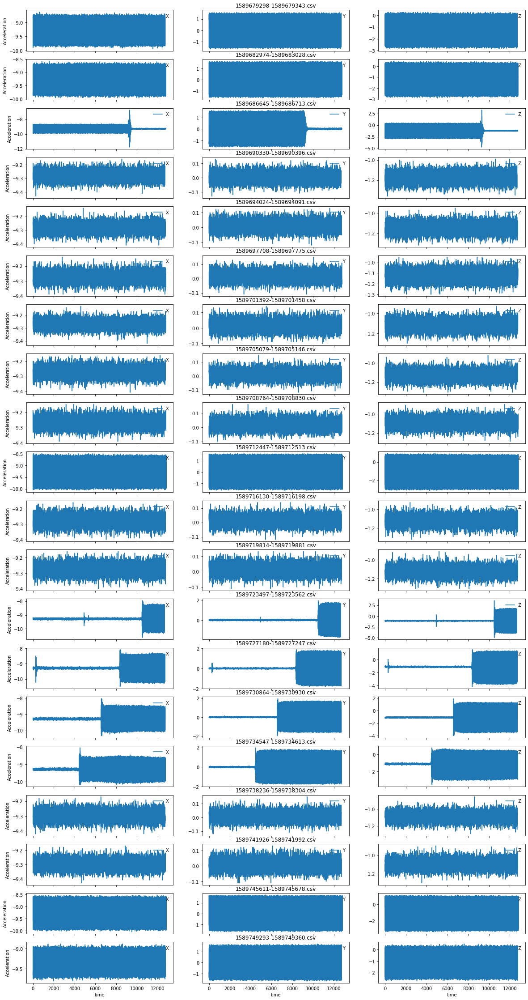

In [ ]:
fig,ax=plt.subplots(N_files,3,figsize=(20,40),sharex=True)
for i in range(N_files):
    # module_i=np.sum(data_files[i][:,:]**2,axis=1)**0.5
    XYZ=data_files[i]
    
    ax[i,0].plot(XYZ[:,0],label='X')
    ax[i,1].plot(XYZ[:,1],label='Y')
    ax[i,2].plot(XYZ[:,2],label='Z')

    ax[i,1].set_title(filenames[i].split('\\')[1])
    ax[i,0].set_ylabel('Acceleration')


for axs in ax.flatten():
    axs.legend(frameon=False,loc=1)

ax[-1,0].set(xlabel='time')
ax[-1,1].set(xlabel='time')
ax[-1,2].set(xlabel='time')
 
 


## As an example and searching for insight, the first measurement will be plotted in a better scale.

Text(0.5, 0, 'time')

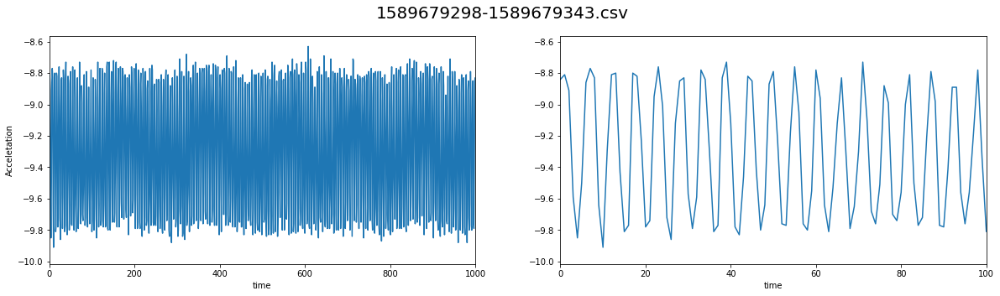

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.suptitle(filenames[0].split('\\')[1],fontsize=20)
plt.plot(data_files[0][:,0])
plt.xlim(0,1000)
plt.xlabel('time')
plt.ylabel('Acceletation')
plt.subplot(122)
plt.plot(data_files[0][:,0])
plt.xlim(0,100)
plt.xlabel('time')


### As seen above, the measurement is a periodic data, so it suggests a further inspection using Fast Fourier Transform
### The figure below shows the analysis of the resultant acceleration module , where |a_r|=(a_x^2+a_y^2+a_z^2)^0.5


Text(0.5, 0.08, 'RPM')

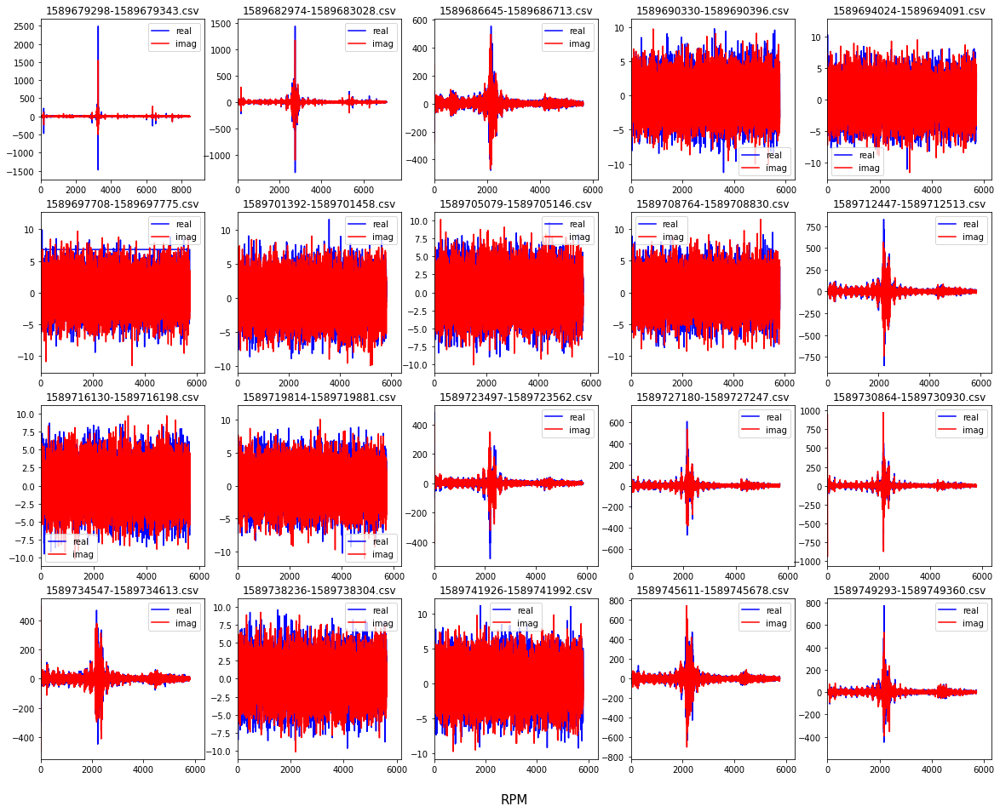

In [ ]:
fig,axs=plt.subplots(4,5,figsize=(20,16))
for i in range(len(data_files)):    
    aux=np.sum(data_files[i]**2,axis=1)**0.5
    aux
    N=len(aux)
    sample_rate=60*N/dt[i]
    freq=np.fft.fftfreq(N,d=1./sample_rate)
    fft_i=np.fft.fftn(aux)
    ax=axs[i//5,i%5]
    ax.plot(freq[1:],(fft_i.real[1:]),'blue',label='real')## \omega_{0} wasn't displayed beacused it has no relevance in the current analysis, since in the sine it dosen't mean anything, and in cosine it just represent the constante part(off-set). Moreover, it was difficulting the qualitative analysis.
    ax.plot(freq[1:],(fft_i[1:].imag),'red',label='imag')
    ax.legend()
    ax.set_xlim(left=0)
    ax.set_title(filenames[i].split('\\')[1])
fig.text(0.5,0.08,'RPM',fontsize=15)

### Now let's look all of them in the same scale

Text(0.5, 0.08, 'RPM')

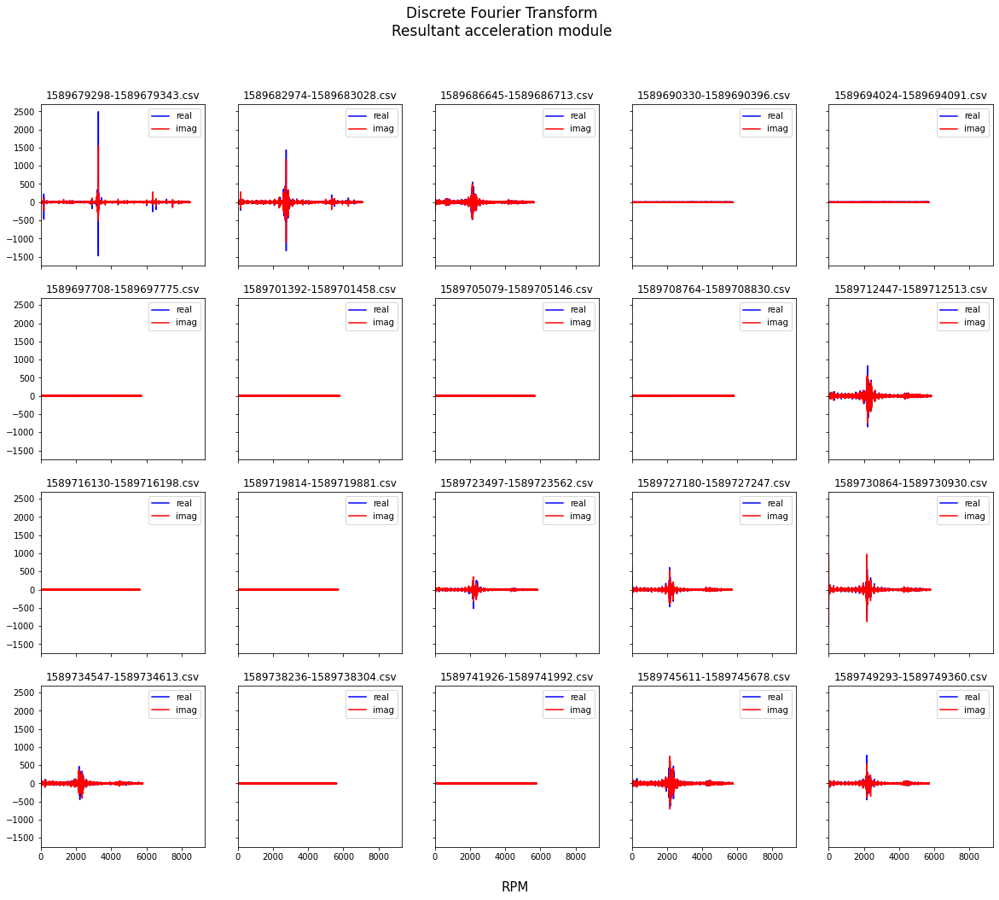

In [ ]:
fig,axs=plt.subplots(4,5,figsize=(20,16),sharex=True,sharey=True)
fig.suptitle("Discrete Fourier Transform\nResultant acceleration module",fontsize=17)
for i in range(len(data_files)):    
    aux=np.sum(data_files[i]**2,axis=1)**0.5
    N=len(aux)
    sample_rate=60*N/dt[i]
    freq=np.fft.fftfreq(N,d=1./sample_rate)
    fft_i=np.fft.fftn(aux)
    ax=axs[i//5,i%5]
    ax.plot(freq[1:],(fft_i.real[1:]),'blue',label='real')## \omega_{0} wasn't displayed beacused it has no relevance in the current analysis, since in the sine it dosen't mean anything, and in cosine it just represent the constante part(off-set). Moreover, it was difficulting the qualitative analysis.
    ax.plot(freq[1:],(fft_i[1:].imag),'red',label='imag')
    ax.legend()
    ax.set_xlim(left=0)
    ax.set_title(filenames[i].split('\\')[1])

fig.text(0.5,0.08,'RPM',fontsize=15)

## It is clear that there are noisy samples, which probably we measured in a downtime. There isn't any great difference between the sine and cosine coefficients, then the power spectral density (PSD) will be taken.

### PSD=T/N |Y(k)|^2 [1]
where T is the period, N is the number of points, Y(k) is the fourier transform

[1] Sousa, Marcos Morais de. "Utilizando a vibração mecânica para monitorar o desgaste das ferramentas de corte e o acabamento superficial no processo de fresamento." (1998).

Text(0.5, 0.08, 'RPM')

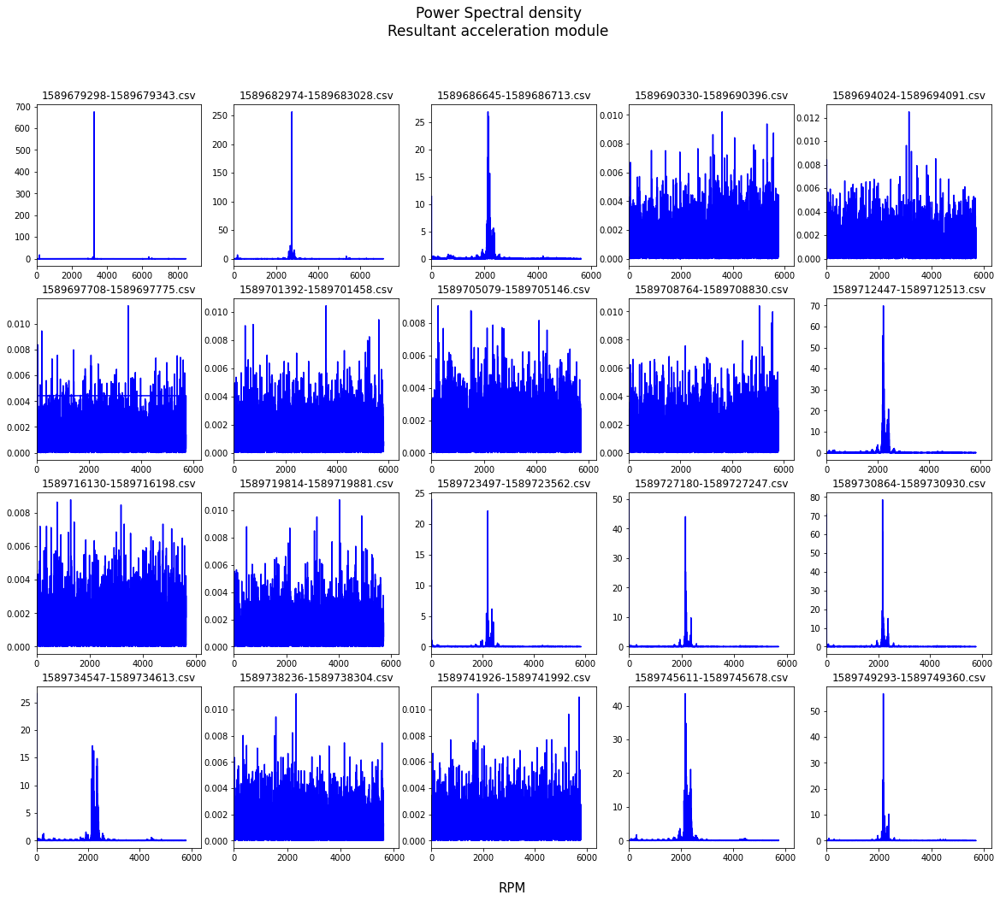

In [ ]:
fig,axs=plt.subplots(4,5,figsize=(20,16))
fig.suptitle("Power Spectral density\nResultant acceleration module",fontsize=17)

for i in range(len(data_files)):    
    aux=np.sum(data_files[i]**2,axis=1)**0.5
    aux
    N=len(aux)
    sample_rate=60*N/dt[i]
    freq=np.fft.fftfreq(N,d=1./sample_rate)
    fft_i=np.fft.fftn(aux)
    PSD=(fft_i*np.conj(fft_i)).real/N
    ax=axs[i//5,i%5]
    ax.plot(freq[1:],(PSD[1:]),'blue',)## \omega_{0} wasn't displayed beacused it has no relevance in the current analysis, since in the sine it dosen't mean anything, and in cosine it just represent the constante part(off-set). Moreover, it was difficulting the qualitative analysis.
    ax.set_xlim(left=0)
    ax.set_title(filenames[i].split('\\')[1])

fig.text(0.5,0.08,'RPM',fontsize=15)

## Although, none systematic analysis were applied to assure the random properties from the noisy sample, they appear to be random and not related to fridge's compressor. 
## More over, all sharp peaks are in the right range, since the frequency of a fridge's compressor in RPM is about [950,4500] [2] as shown in the chart below

![img1](https://i.ibb.co/NtKV5yz/rpm-range.png)

[2] https://refrigerationclub.com/compressors-variable-speed-reality-market/

### Diving a little deeper, the PSD of each acceleration component will be plotted.

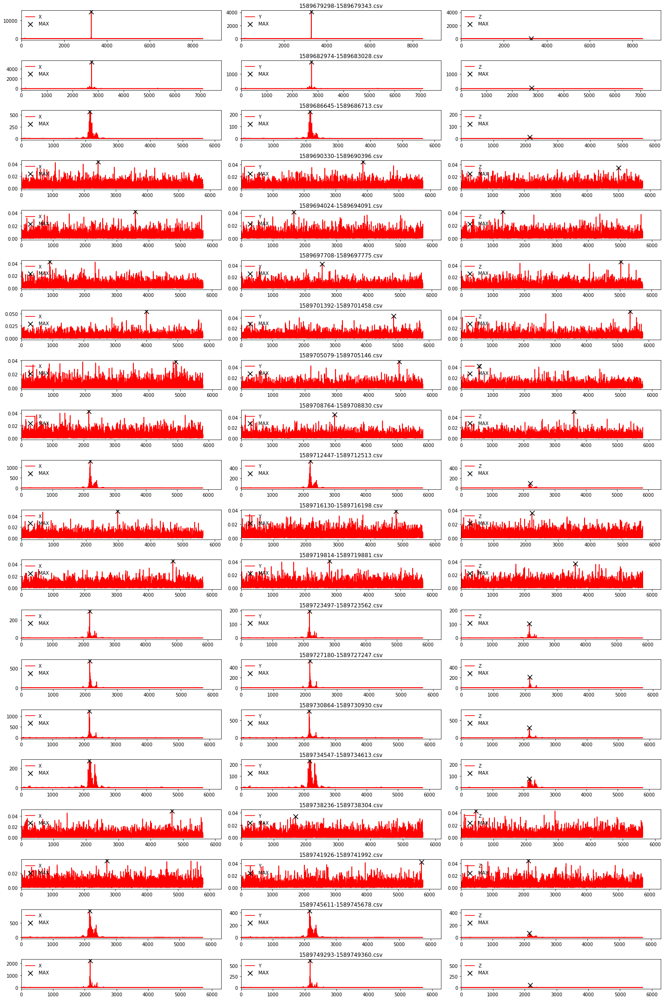

In [ ]:
fig,ax=plt.subplots(20,3,figsize=(20,30))
label=['X','Y','Z']
MAXIMUM=np.zeros((N_files,2))
for i in range(N_files):
    aux=data_files[i]
    N=len(aux)
    sample_rate=60*N/dt[i]
    freq=np.fft.fftfreq(N,d=1./sample_rate)
    fft_i=np.fft.fftn(aux)
    ax[i,1].set_title(filenames[i].split('\\')[1])
    for j in range(3):
        PSD=(fft_i[:,j]*np.conj(fft_i[:,j])).real/N

        ax[i,j].plot(freq[1:],PSD[1:],'red',label=label[j])
        index_max=np.argmax(PSD[1:len(PSD)//2])+1
        MAXIMUM=[freq[index_max],PSD[index_max]]
        ax[i,j].scatter(freq[index_max],PSD[index_max],marker='x',color='black',s=100,zorder=100,label='MAX')
        ax[i,j].legend(frameon=False,loc=2)
        ax[i,j].set(xlim=(0,None))
        
        

plt.tight_layout()

## Differences have arisen from the inspection of each component, mainly in the samples where the compressor is assumed to be On.

In [ ]:
def gaussian(x,mu,sigma,scaler):
    return np.exp(-0.5*(x-mu)**2./sigma**2.)*(2.*np.pi)**-0.5*sigma**-1.*scaler


In [ ]:
def fit_gaussian(Y,X,peak,width,scaler):
    width=int(width)
    model=Model(gaussian)
    left=int(peak-width)
    right=int(peak+width)
    result=model.fit(Y[left:right],x=X[left:right],mu=X[peak],sigma=np.std(Y[left:right]),scaler=scaler)
    sigma=result.best_values['sigma']
    mu=result.best_values['mu']
    scaler=result.best_values['scaler']
    
    return mu,sigma,scaler
    
def plot_gaussian(mu,sigma,scaler,axs):
    X=np.linspace(mu-sigma*3,mu+sigma*3,100)
    Y=gaussian(X,mu,sigma,scaler)
    axs.plot(X,Y,linewidth=4,color='black',linestyle='dashed')


## A common technique from radiation spectroscopy is to try to fit photopeak with a gaussian, Here it will be trying to fit a Gaussian distribution in the frequency peak, which probably is the compressor's RPM.

Text(0.5, 0.08, 'RPM')

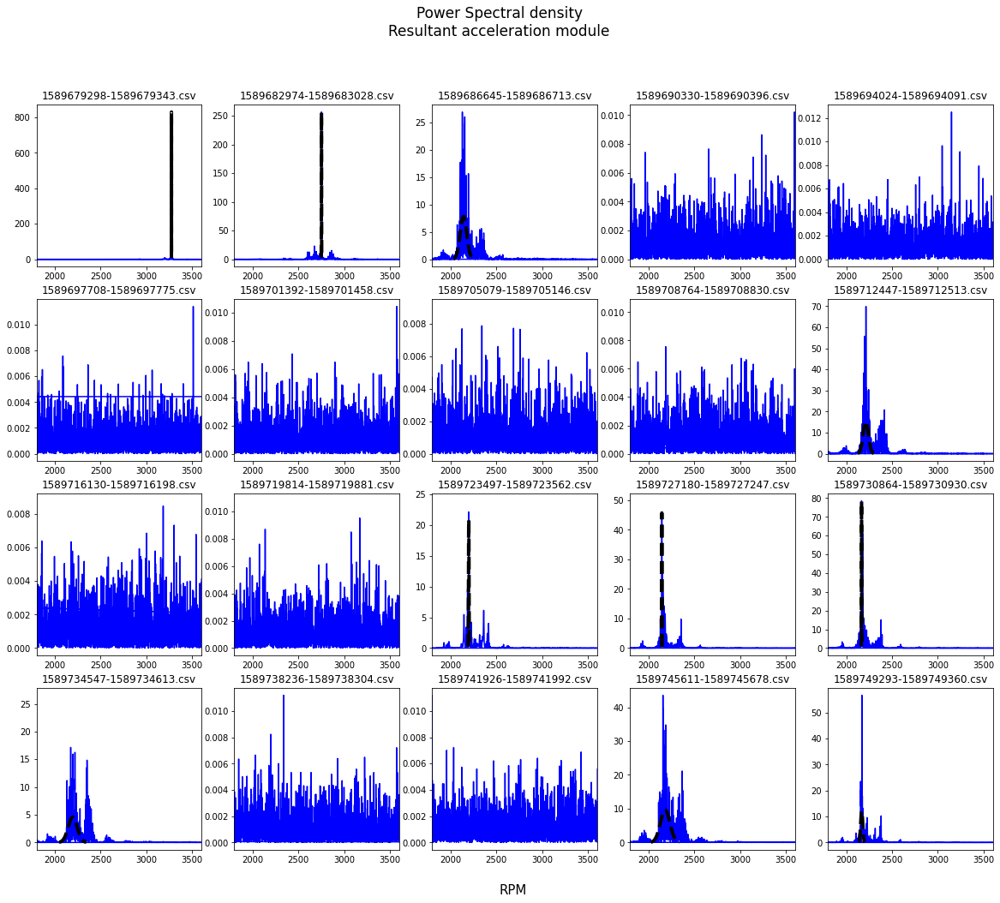

In [ ]:
fig,axs=plt.subplots(4,5,figsize=(20,16))
fig.suptitle("Power Spectral density\nResultant acceleration module",fontsize=17)
mean=[]
std=[]
for i in range(N_files):    
    aux=np.sum(data_files[i]**2,axis=1)**0.5
    aux
    N=len(aux)
    sample_rate=60*N/dt[i]
    freq=np.fft.fftfreq(N,d=1./sample_rate)
    fft_i=np.fft.fftn(aux)
    PSD=(fft_i*np.conj(fft_i)).real/N
    ax=axs[i//5,i%5]
    ax.plot(freq[1:],(PSD[1:]),'blue',)## \omega_{0} wasn't displayed beacused it has no relevance in the current analysis, since in the sine it dosen't mean anything, and in cosine it just represent the constante part(off-set). Moreover, it was difficulting the qualitative analysis.
    ax.set_xlim(left=0)
    index_max=np.argmax(PSD[10:len(PSD)//2])+10
    MAXIMUM=[freq[index_max],PSD[index_max]]
    if MAXIMUM[1]>1:
        mu,sigma,scaler=fit_gaussian(PSD,freq,index_max,1000,10)
        plot_gaussian(mu,sigma,scaler,ax)
        mean.append(mu)
        std.append(sigma)
    ax.set_xlim(1800,3600)
    ax.set_title(filenames[i].split('\\')[1])
fig.text(0.5,0.08,'RPM',fontsize=15)

## The collection 1589679298-1589679343.csv is qualitatively outlying from the other samples claimed to be ON.

## If attention were paid to graphs in time domain, it will be detected that there are samples whose behavior changes during the measurement. So the Gabor transform, also known as Spectogram would a valuable tool in the vibration analysis, since it provides a FFT for a given time interval.

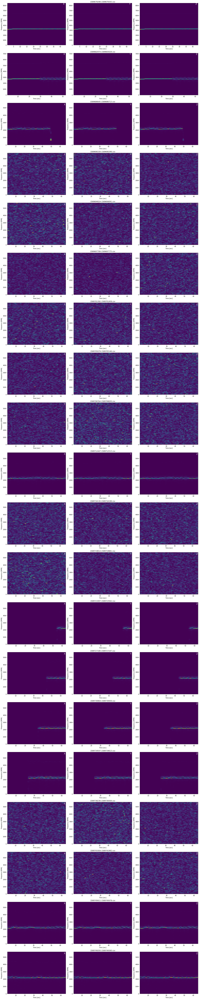

In [ ]:
fig,ax=plt.subplots(20,3,figsize=(20,100))
label=['X','Y','Z']

for k in range(N_files):
    aux=data_files[k]
    N=len(aux)
    sample_rate=N/dt[k]
    ax[k,1].set_title(filenames[k].split('\\')[1])
    for i in range(3):
        f, t, Sxx = scipy.signal.spectrogram(aux[:,i], sample_rate)
        ax[k,i].pcolormesh(t, f*60, Sxx, shading='gouraud')

        ax[k,i].set_ylabel('Frequency [RPM]')
        ax[k,i].set_xlabel('Time [sec]')
        ax[k,i].text(max(t)-2,max(f)*60-300,label[i],color='white',fontsize=15)
plt.tight_layout()

## Excluding the first collection all samples agree in the frequency range, and It is easy to remark when the frequency disappear, i.e., when the compressor is ON or OFF. 




## To define the fridge's compressor frequency It will be used the Gaussian fit on PSD, the frequency error will be 3 times the fit's standard deviation. Moreover, the collection 1589679298-1589679343.csv will not be used in the mean, since it is assumed to be an outlier. Using the frequencies and their error a weighted average will be taken, the wight is inversely proportional to the error.

In [ ]:
mean=np.asarray(mean)
std=np.asarray(std)
RPM=np.average(mean[1:],weights=1./std[1:])
ERROR=np.mean(3*std)
print('The RPM of the fidge is %.2f +/- %.2f' %(RPM,ERROR))

The RPM of the fidge is 2318.03 +/- 55.10


# The RPM of the fidge's compressor is 2318+/- 55

## The class UPTIME Downtime uses the spectogram data to classify a single second as uptime or downtime.
## How does it work?
## Firstly the spectogram is generated, then the image is compressed and uncompressed using wavelets for dimension reduction.
## Then the model is trained using monotonic samples, by monotonic I mean all spectogram that could be related to a single behavior, uptime or downtime.
## Lastly, the model predict a label for all data collected.




In [ ]:


class Up_down_time():
    def __init__(self,model):
        self.model=model
        
    def image_compression_spectogram(self,data,sample_rate,wavelet='db1',keep=1.):
        f, t, Sxx = scipy.signal.spectrogram(data, sample_rate)
        coeffs = pywt.wavedec2(Sxx,wavelet=wavelet,level=4)
        coeff_arr, coeff_slices = pywt.coeffs_to_array(coeffs)
        Csort = np.sort(np.abs(coeff_arr.reshape(-1)))
        thresh = Csort[int(np.floor((1-keep)*len(Csort)))]
        ind = np.abs(coeff_arr) > thresh
        Cfilt = coeff_arr * ind        
        coeffs_filt = pywt.array_to_coeffs(Cfilt,coeff_slices,output_format='wavedec2')      
        Arecon = pywt.waverec2(coeffs_filt,wavelet=wavelet)
    
        return Arecon
    
    def training(self,train_data,label_train_data,time_train_data,test_size=0.25,seed=123):
        samples=[]
        for sample,label,T in zip(train_data,label_train_data,time_train_data):
            sample_rate=len(sample)/T
            spec_compressed=self.image_compression_spectogram(sample,sample_rate)
            spec_compressed=np.transpose(spec_compressed)
            rows=(spec_compressed.shape)[0]
            samples.append(np.hstack((spec_compressed,np.ones((rows,1))*label)))
        
        X_Y=samples[0]
        for i in range(1,len(samples)):
            X_Y=np.vstack((X_Y,samples[i]))

        
        np.random.seed(seed)        
        X_train,X_test,Y_train,Y_test=train_test_split(X_Y[:,:-1],X_Y[:,-1],test_size=test_size,stratify=X_Y[:,-1])
        
        self.model.fit(X_train,Y_train)
        accuracy=self.model.score(X_test,Y_test)

        test_result='It was used %d seconds to train the model\nIt was used %d seconds to test the model\nThe test result obtained an accuracy of  %.2f %%' %(len(Y_train),len(Y_test),accuracy*100) 
        print(test_result)
        
    def run(self,data,time_data):
        time_on=0
        time_off=0
        for sample,dt in zip(data,time_data):
            sample_rate=len(sample)/dt
            img_compressed=self.image_compression_spectogram(sample,sample_rate)
            X=np.transpose(img_compressed)
            Y=self.model.predict(X)
            time_on+=sum(Y) 
            time_off+=sum(Y-1)*-1
        minutes_on=time_on//60
        seconds_on=time_on%60
        minutes_off=time_off//60
        seconds_off=time_off%60

        time='%d minutes and %d seconds ON\n%d minutes and %d seconds OFF' % (minutes_on,seconds_on,minutes_off,seconds_off)
        
        print(time)
        

        
    


## Four collection which have recognizable, or monotonic, behavior was used to train the model, the collections were:
1. 1589679298-1589679343.csv
2. 1589682974-1589683028.csv
3. 1589741926-1589741992.csv
4. 1589738236-1589738304.csv

In [ ]:
monotonic=[np.sum(data_files[index]**2,axis=1)**0.5 for index in [0,1,-3,-4]]
time_mono=[dt[0],dt[1],dt[-3],dt[-4]]
label_mono=[1,1,0,0]
ALL_module_data=[np.sum(data_files[index]**2,axis=1)**0.5 for index in range(N_files)]


In [ ]:
DUMMY=Up_down_time(DummyClassifier())
DUMMY.training(monotonic,label_mono,time_mono)
DUMMY.run(ALL_module_data,dt)

It was used 168 seconds to train the model
It was used 56 seconds to test the model
The test result obtained an accuracy of  50.00 %
0 minutes and 0 seconds ON
18 minutes and 46 seconds OFF


In [ ]:
NB=Up_down_time(MultinomialNB())
NB.training(monotonic,label_mono,time_mono)
NB.run(ALL_module_data,dt)

It was used 168 seconds to train the model
It was used 56 seconds to test the model
The test result obtained an accuracy of  98.21 %
7 minutes and 10 seconds ON
11 minutes and 36 seconds OFF


In [ ]:
RF=Up_down_time(RandomForestClassifier())
RF.training(monotonic,label_mono,time_mono)
RF.run(ALL_module_data,dt)

It was used 168 seconds to train the model
It was used 56 seconds to test the model
The test result obtained an accuracy of  100.00 %
7 minutes and 1 seconds ON
11 minutes and 45 seconds OFF


In [ ]:
SVC_=Up_down_time(SVC())
SVC_.training(monotonic,label_mono,time_mono)
SVC_.run(ALL_module_data,dt)

It was used 168 seconds to train the model
It was used 56 seconds to test the model
The test result obtained an accuracy of  100.00 %
6 minutes and 55 seconds ON
11 minutes and 51 seconds OFF


## As final answer to uptime and downtime, since all ML models were good, and they didn't deviate a lot, it will be taken the higher time as upper limit and the lower as bottom limit
## Therefore, the UpTime is 7 minutes and 2 seconds +/- 8 seconds
## the Downtime is 11 minutes and 44 seconds +/- 8 seconds


### The results were biased by the training sample, it would be interesting to see which result could be found using a clustering algorithm.

In [ ]:
def K_factor(sample):
    XYZ=data_files[sample]
    N=(XYZ.shape)[0]
    x,y,z=np.zeros(N-1),np.zeros(N-1),np.zeros(N-1)
    for i in range(1,N):
        x[i-1]=np.abs(max(XYZ[:i,0])*np.mean(XYZ[:i,0]**2)**.5)
        y[i-1]=np.abs(max(XYZ[:i,1])*np.mean(XYZ[:i,1]**2)**.5)
        z[i-1]=np.abs(max(XYZ[:i,2])*np.mean(XYZ[:i,2]**2)**.5)
    return x,y,z
        

## According to [3], the K factor shows different shapes depending on its state. The graph below illustrate the different shapes.

[3]Bezerra, Roberto de Araujo. "Detecção de falhas em rolamentos por análise de vibração." (2004).

![img_f_factor](https://i.ibb.co/VTKkzT9/K-factor.png)

## Since the factor is computed when the compressor is On, Only the follow collections were analysed:
1. 1589679298-1589679343.csv
2. 1589682974-1589683028.csv
3. 1589749293-1589749360.csv
4. 1589745611-1589745678.csv

## They were selected because their spectogram assure the uptime characteristics.

Text(0.5, 0.06, 'time')

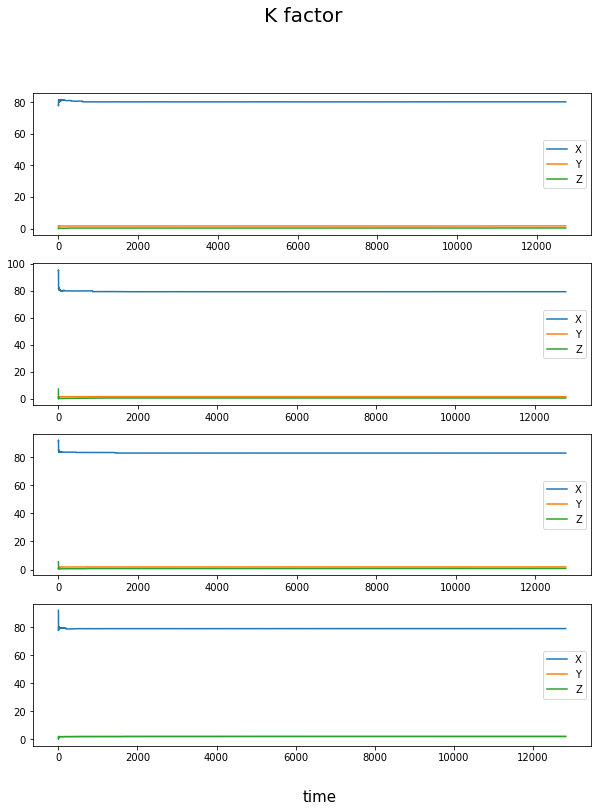

In [ ]:
fig,ax=plt.subplots(4,1,figsize=(10,12))
samples=[0,1,18,19]
fig.suptitle('K factor',fontsize=20)
for i in range(4):
    x,y,z=K_factor(samples[i])
    ax[i].plot(x,label='X')
    ax[i].plot(y,label='Y')
    ax[i].plot(z,label='Z')
    ax[i].legend()
fig.text(0.5,0.06,'time',fontsize=15)

## Another parameter to evaluate the machine is the curtosis [3], as shown in the graphic bellow
![img_kurtosis](https://i.ibb.co/6Fw6gfX/kurtosis.png)

In [ ]:
for i in samples:
    XYZ=data_files[i]
    data=(np.sum(XYZ**2,axis=1))**0.5
    print('Sample '+str(i+1)+'  -- Kurtosis:')
    print(scipy.stats.kurtosis(data))
    print('\n')

Sample 1  -- Kurtosis:
-1.518957455498022


Sample 2  -- Kurtosis:
-1.542101090431754


Sample 0  -- Kurtosis:
-1.462793489921487


Sample -1  -- Kurtosis:
-1.5085465352671366




# In [4] it is presented many aspects of Unbalence, and Misaligned machines, but none of them were found in the spectral analysis. For example, the harmonics frequecies amplitude are an indication of problems, but not even the second harmonic was observed in the spectrum.
[4]Mais, Jason. "Spectrum analysis: the key features of analyzing spectra." SKF USA, Inc (2002).

# Therefore, the indicators chosen suggest that fridge's compressor is working with no explicit fault. However, the first collection has a frequency too far from the others, what wasn't explained in the present work.